In [1]:
#-----------------------------------
# GLOBAL FEATURE EXTRACTION
#-----------------------------------
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import mahotas


#--------------------

# tunable-parameters
#--------------------
images_per_class       = 800
fixed_size             = tuple((500, 500))
train_path             = "dataset/train"
h5_train_data          = 'output/train_data.h5'
h5_train_labels        = 'output/train_labels.h5'
bins                   = 8


In [2]:
import cv2
import os
import h5py
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from matplotlib.colors import hsv_to_rgb

In [3]:
# Converting each image to RGB from BGR format

def rgb_bgr(image):
    rgb_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return rgb_img


In [4]:
# Conversion to HSV image format from RGB

def bgr_hsv(rgb_img):
    hsv_img = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2HSV)
    return hsv_img

In [5]:
# image segmentation

# for extraction of green and brown color


def img_segmentation(rgb_img,hsv_img):
    lower_green = np.array([25,0,20])
    upper_green = np.array([100,255,255])
    healthy_mask = cv2.inRange(hsv_img, lower_green, upper_green)
    result = cv2.bitwise_and(rgb_img,rgb_img, mask=healthy_mask)
    lower_brown = np.array([10,0,10])
    upper_brown = np.array([30,255,255])
    disease_mask = cv2.inRange(hsv_img, lower_brown, upper_brown)
    disease_result = cv2.bitwise_and(rgb_img, rgb_img, mask=disease_mask)
    final_mask = healthy_mask + disease_mask
    final_result = cv2.bitwise_and(rgb_img, rgb_img, mask=final_mask)
    return final_result


In [6]:
# feature-descriptor-1: Hu Moments
def fd_hu_moments(image):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    feature = cv2.HuMoments(cv2.moments(image)).flatten()
    return feature

In [7]:
# feature-descriptor-2: Haralick Texture
def fd_haralick(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    haralick = mahotas.features.haralick(gray).mean(axis=0)
    return haralick

In [8]:
# feature-descriptor-3: Color Histogram
def fd_histogram(image, mask=None):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    hist  = cv2.calcHist([image], [0, 1, 2], None, [bins, bins, bins], [0, 256, 0, 256, 0, 256])
    cv2.normalize(hist, hist)
    return hist.flatten()

In [9]:
# get the training labels
train_labels = os.listdir(train_path)

# sort the training labels
train_labels.sort()
print(train_labels)

# empty lists to hold feature vectors and labels
global_features = []
labels          = []

['diseased', 'healthy']


In [10]:
import cv2

In [11]:
import os
import cv2
import numpy as np

# loop over the training data sub-folders
for training_name in train_labels:
    # join the training data path and each species training folder
    dir = os.path.join(train_path, training_name)

    # get the current training label
    current_label = training_name

    # loop over the images in each sub-folder
    for x in range(1, images_per_class + 1):
        # get the image file name
        file = os.path.join(dir, str(x) + ".jpg")

        # read the image and check if it's loaded successfully
        image = cv2.imread(file)
        if image is None:
            print("[ERROR] Unable to load image: {}".format(file))
            continue

        image = cv2.resize(image, fixed_size)

        # Running Function Bit By Bit
        RGB_BGR = rgb_bgr(image)
        BGR_HSV = bgr_hsv(RGB_BGR)
        IMG_SEGMENT = img_segmentation(RGB_BGR, BGR_HSV)

        # Call for Global Feature Descriptors
        fv_hu_moments = fd_hu_moments(IMG_SEGMENT)
        fv_haralick = fd_haralick(IMG_SEGMENT)
        fv_histogram = fd_histogram(IMG_SEGMENT)

        # Concatenate 
        global_feature = np.hstack([fv_histogram, fv_haralick, fv_hu_moments])

        # update the list of labels and feature vectors
        labels.append(current_label)
        global_features.append(global_feature)

    print("[STATUS] Processed folder: {}".format(current_label))

print("[STATUS] Completed Global Feature Extraction...")


[STATUS] Processed folder: diseased
[ERROR] Unable to load image: dataset/train\healthy\68.jpg
[STATUS] Processed folder: healthy
[STATUS] Completed Global Feature Extraction...


In [12]:
# get the overall feature vector size
print("[STATUS] feature vector size {}".format(np.array(global_features).shape))

[STATUS] feature vector size (1599, 532)


In [13]:
# get the overall training label size
print("[STATUS] training Labels {}".format(np.array(labels).shape))

[STATUS] training Labels (1599,)


In [14]:
# encode the target labels
targetNames = np.unique(labels)
le          = LabelEncoder()
target      = le.fit_transform(labels)
print("[STATUS] training labels encoded...")

[STATUS] training labels encoded...


In [15]:
# scale features in the range (0-1)
from sklearn.preprocessing import MinMaxScaler
scaler            = MinMaxScaler(feature_range=(0, 1))
rescaled_features = scaler.fit_transform(global_features)
print("[STATUS] feature vector normalized...")

[STATUS] feature vector normalized...


In [16]:
print("[STATUS] target labels: {}".format(target))
print("[STATUS] target labels shape: {}".format(target.shape))

[STATUS] target labels: [0 0 0 ... 1 1 1]
[STATUS] target labels shape: (1599,)


In [17]:
# save the feature vector using HDF5
h5f_data = h5py.File(h5_train_data, 'w')
h5f_data.create_dataset('dataset_1', data=np.array(rescaled_features))

<HDF5 dataset "dataset_1": shape (1599, 532), type "<f8">

In [18]:
h5f_label = h5py.File(h5_train_labels, 'w')
h5f_label.create_dataset('dataset_1', data=np.array(target))

<HDF5 dataset "dataset_1": shape (1599,), type "<i8">

In [19]:
h5f_data.close()
h5f_label.close()

In [20]:
from sklearn.linear_model import LogisticRegression

In [21]:
# training
#-----------------------------------
# TRAINING OUR MODEL
#-----------------------------------
import h5py
import numpy as np
import os
import glob
import cv2
import warnings
import sklearn
from matplotlib import pyplot
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC



warnings.filterwarnings('ignore')

#--------------------
# tunable-parameters
#--------------------
num_trees = 100
test_size = 0.20
seed      = 9
train_path = "dataset/train"
test_path  = "dataset/test"
h5_train_data    = 'output/train_data.h5'
h5_train_labels  = 'output/train_labels.h5'
scoring    = "accuracy"

# get the training labels
train_labels = os.listdir(train_path)

# sort the training labels
train_labels.sort()

if not os.path.exists(test_path):
    os.makedirs(test_path)

# create all the machine learning models
models = []
models.append(('LR', LogisticRegression(random_state=seed)))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier(random_state=seed)))
models.append(('RF', RandomForestClassifier(n_estimators=num_trees, random_state=seed)))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC(random_state=seed)))

# variables to hold the results and names
results = []
names   = []

# import the feature vector and trained labels
h5f_data  = h5py.File(h5_train_data, 'r')
h5f_label = h5py.File(h5_train_labels, 'r')

global_features_string = h5f_data['dataset_1']
global_labels_string   = h5f_label['dataset_1']

global_features = np.array(global_features_string)
global_labels   = np.array(global_labels_string)

h5f_data.close()
h5f_label.close()

# verify the shape of the feature vector and labels
print("[STATUS] features shape: {}".format(global_features.shape))
print("[STATUS] labels shape: {}".format(global_labels.shape))

print("[STATUS] training started...")


[STATUS] features shape: (1599, 532)
[STATUS] labels shape: (1599,)
[STATUS] training started...


In [22]:
# split the training and testing data
(trainDataGlobal, testDataGlobal, trainLabelsGlobal, testLabelsGlobal) = train_test_split(np.array(global_features),
                                                                                          np.array(global_labels),
                                                                                          test_size=test_size,
                                                                                          random_state=seed)

print("[STATUS] splitted train and test data...")
print("Train data  : {}".format(trainDataGlobal.shape))
print("Test data   : {}".format(testDataGlobal.shape)) 

[STATUS] splitted train and test data...
Train data  : (1279, 532)
Test data   : (320, 532)


In [23]:
trainDataGlobal

array([[0.90470961, 0.03308547, 0.03047729, ..., 0.01058886, 0.12692807,
        0.96573214],
       [0.97626859, 0.00408284, 0.01151801, ..., 0.01058886, 0.12692663,
        0.96573216],
       [0.96392489, 0.0527582 , 0.0425243 , ..., 0.01059047, 0.12726795,
        0.96573253],
       ...,
       [0.77039234, 0.        , 0.        , ..., 0.01058886, 0.12693296,
        0.96573218],
       [0.96965597, 0.        , 0.        , ..., 0.01058989, 0.1271198 ,
        0.96574232],
       [0.98389776, 0.19183335, 0.15462199, ..., 0.01058898, 0.12695993,
        0.96573136]])

LR: 0.922613 (0.030114)
LDA: 0.910089 (0.026657)
KNN: 0.925744 (0.027307)
CART: 0.894488 (0.022342)
RF: 0.964032 (0.014070)
NB: 0.855370 (0.019435)
SVM: 0.918701 (0.034242)


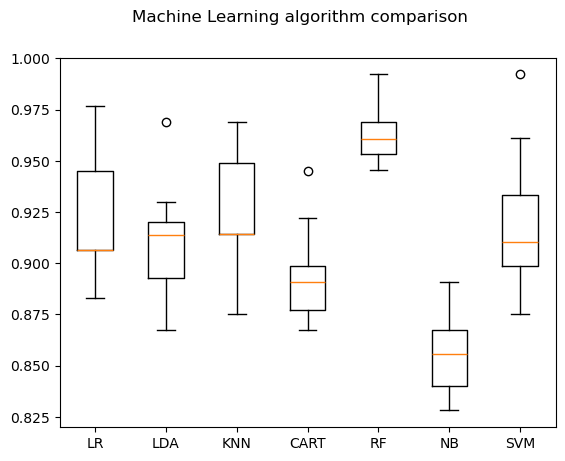

In [24]:
# 10-fold cross validation
for name, model in models:
    kfold = KFold(n_splits=10, random_state=seed,shuffle=True)
    cv_results = cross_val_score(model, trainDataGlobal, trainLabelsGlobal, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

# boxplot algorithm comparison
fig = pyplot.figure()
fig.suptitle('Machine Learning algorithm comparison')
ax = fig.add_subplot(111)
pyplot.boxplot(results)
ax.set_xticklabels(names)
pyplot.show()

In [25]:
clf  = RandomForestClassifier(n_estimators=num_trees, random_state=seed)

In [26]:
clf.fit(trainDataGlobal, trainLabelsGlobal)


RandomForestClassifier(random_state=9)

In [27]:
y_predict=clf.predict(testDataGlobal)

In [28]:
y_predict

array([1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1,
       0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0,
       1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1,
       0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0,
       0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1,
       0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0,
       1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1,
       1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1,
       0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1,
       0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1,
       1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,

In [29]:
cm = confusion_matrix(testLabelsGlobal,y_predict)

<Axes: >

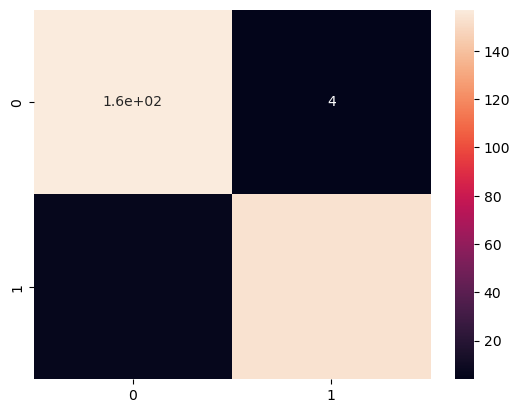

In [30]:
import seaborn as sns
sns.heatmap(cm ,annot=True)

In [31]:
print(classification_report(testLabelsGlobal,y_predict))

              precision    recall  f1-score   support

           0       0.96      0.98      0.97       161
           1       0.97      0.96      0.97       159

    accuracy                           0.97       320
   macro avg       0.97      0.97      0.97       320
weighted avg       0.97      0.97      0.97       320



In [32]:
from sklearn.metrics import accuracy_score

In [33]:
accuracy_score(testLabelsGlobal, y_predict)

0.96875

TESTING

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy import ndimage
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from matplotlib.colors import hsv_to_rgb

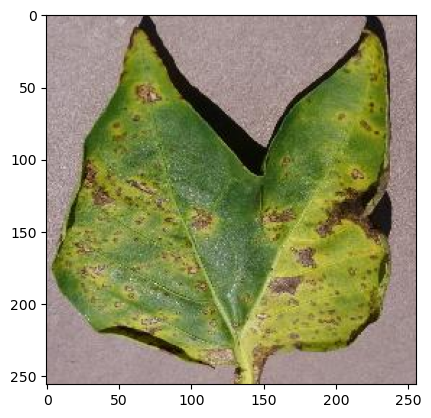

In [2]:
import cv2
import matplotlib.pyplot as plt

# Read the image
img = cv2.imread("D:/Zohaib Btech/Zohaib/projects/plantDisease/dataset/PlantVillage/Pepper__bell___Bacterial_spot/1b0cfb07-f452-49e0-85ad-45f3f519ca7a___JR_B.Spot 9094.JPG")  # Use forward slashes for file paths

# Check if the image is read correctly
if img is not None:
    # Display the image
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for Matplotlib
    plt.imshow(img_rgb)
    plt.show()
else:
    print("Error: Failed to read the image.")


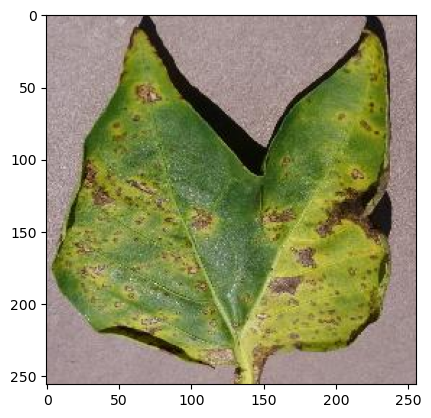

In [3]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

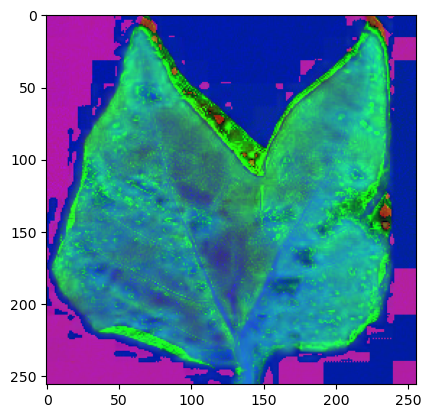

In [4]:
hsv_img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
plt.imshow(hsv_img)

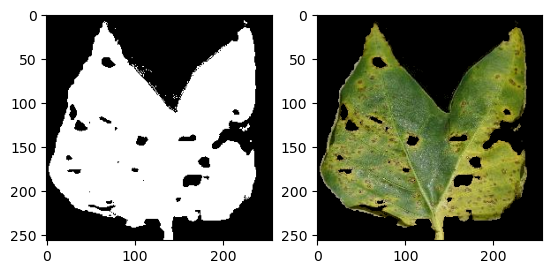

In [7]:
lower_green = np.array([25,0,20])
upper_green = np.array([100,255,255])
mask = cv2.inRange(hsv_img, lower_green, upper_green)
result = cv2.bitwise_and(img, img, mask=mask)
plt.subplot(1, 2, 1)
plt.imshow(mask, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(result)
plt.show()

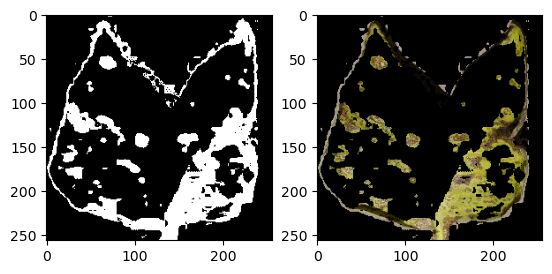

In [8]:
# lower_green = np.array([25,0,20])
# upper_green = np.array([100,255,255])
# mask = cv2.inRange(hsv_img, lower_green, upper_green)
# result = cv2.bitwise_and(img, img, mask=mask)
# plt.subplot(1, 2, 1)
# plt.imshow(mask, cmap="gray")
# plt.subplot(1, 2, 2)
# plt.imshow(result)
# plt.show()
lower_brown = np.array([10,0,10])
upper_brown = np.array([30,255,255])
disease_mask = cv2.inRange(hsv_img, lower_brown, upper_brown)
disease_result = cv2.bitwise_and(img, img, mask=disease_mask)
plt.subplot(1, 2, 1)
plt.imshow(disease_mask, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(disease_result)
plt.show()

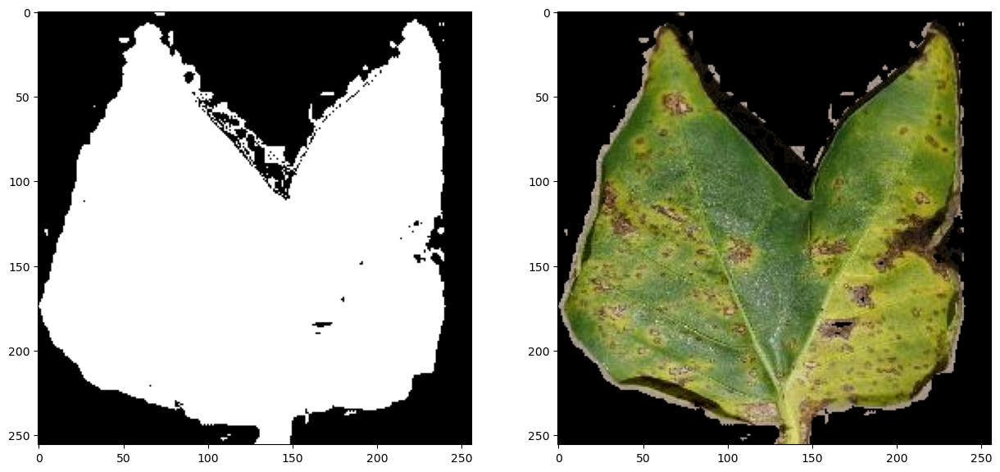

In [9]:
final_mask = mask + disease_mask
final_result = cv2.bitwise_and(img, img, mask=final_mask)
plt.figure(figsize=(15,15))
plt.subplot(1, 2, 1)
plt.imshow(final_mask, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(final_result)
plt.show()

In [10]:
import numpy as np
# Calculate the total number of pixels in the leaf area
leaf_pixels = np.count_nonzero(final_mask)

# Calculate the number of pixels affected by the disease
disease_pixels = np.count_nonzero(disease_mask)

print("Total number of pixels in the leaf area:", leaf_pixels)
print("Number of pixels affected by the disease:", disease_pixels)


Total number of pixels in the leaf area: 41086
Number of pixels affected by the disease: 13578


In [55]:
# Calculate the accuracy of disease detection
accuracy = (disease_pixels / leaf_pixels) * 100

print("Accuracy of disease detection:", accuracy, "%")


Accuracy of disease detection: 20.550580431177444 %


In [43]:
# Feature Descriptor using ORB
orb = cv2.ORB_create()

# Find keypoints and descriptors using ORB
kp_orb, des_orb = orb.detectAndCompute(final_result, None)

# Get the number of keypoints detected
len(kp_orb)


337

In [62]:
print(kp_orb)

(< cv2.KeyPoint 000001FF86CE69D0>, < cv2.KeyPoint 000001FF86CE7750>, < cv2.KeyPoint 000001FF86CE6E80>, < cv2.KeyPoint 000001FF86CE6FD0>, < cv2.KeyPoint 000001FF86CE7150>, < cv2.KeyPoint 000001FF86CE79C0>, < cv2.KeyPoint 000001FF86CE7C90>, < cv2.KeyPoint 000001FF86CE7B40>, < cv2.KeyPoint 000001FF86CE7990>, < cv2.KeyPoint 000001FF86CE7F90>, < cv2.KeyPoint 000001FF86CE6BE0>, < cv2.KeyPoint 000001FF86CBB990>, < cv2.KeyPoint 000001FF86CBB6C0>, < cv2.KeyPoint 000001FF86CBB780>, < cv2.KeyPoint 000001FF86CBB660>, < cv2.KeyPoint 000001FF86CBB3F0>, < cv2.KeyPoint 000001FF86CBBE40>, < cv2.KeyPoint 000001FF86CBB750>, < cv2.KeyPoint 000001FF86CBB840>, < cv2.KeyPoint 000001FF86CBB2A0>, < cv2.KeyPoint 000001FF86CBB270>, < cv2.KeyPoint 000001FF86CBB4E0>, < cv2.KeyPoint 000001FF86CBB360>, < cv2.KeyPoint 000001FF86CBB690>, < cv2.KeyPoint 000001FF86CBB1B0>, < cv2.KeyPoint 000001FF86CBB1E0>, < cv2.KeyPoint 000001FF86CBB420>, < cv2.KeyPoint 000001FF86CBB7E0>, < cv2.KeyPoint 000001FF86CBB7B0>, < cv2.KeyPoin

In [11]:
print("Descriptors shape:", des_orb.shape)
print("Descriptors datatype:", des_orb.dtype)

NameError: name 'des_orb' is not defined

In [24]:
img2 = cv2.drawKeypoints(final_result,kp_orb,None,(255,0,0),4)

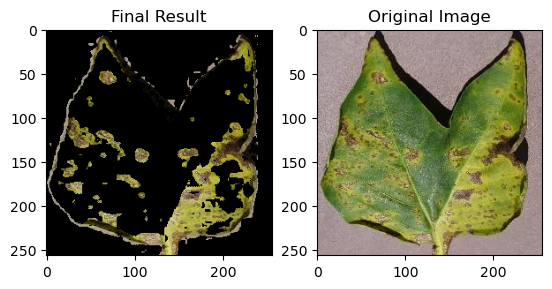

In [12]:
plt.subplot(1, 2, 1)
plt.imshow(disease_result)
plt.title('Final Result')

img = cv2.imread("D:/Zohaib Btech/Zohaib/projects/plantDisease/dataset/PlantVillage/Pepper__bell___Bacterial_spot/1b0cfb07-f452-49e0-85ad-45f3f519ca7a___JR_B.Spot 9094.JPG")
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.show()


In [67]:
# global Feature
global_feature = des_orb

In [68]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))
rescaled_features = scaler.fit_transform(global_feature)

In [69]:
global_feature.shape

(403, 32)

In [70]:
orb.descriptorSize()

32

In [71]:
print("[STATUS] feature vector size {}".format(np.array(global_feature).shape))

[STATUS] feature vector size (403, 32)


In [45]:
a = global_feature
np.savetxt("doo.csv", a, delimiter=",")

In [73]:
import pandas as pd

# Load data from the CSV file
data = pd.read_csv("doo.csv")

# Display the first few rows of the DataFrame
print("Data loaded successfully. Here are the first few rows:")
print(data.head())


Data loaded successfully. Here are the first few rows:
   2.000000000000000000e+00  2.400000000000000000e+01  \
0                      81.0                      56.0   
1                      51.0                     153.0   
2                      66.0                     154.0   
3                      53.0                      38.0   
4                      42.0                     184.0   

   4.600000000000000000e+01  1.260000000000000000e+02  \
0                     143.0                      55.0   
1                     135.0                      21.0   
2                     140.0                     181.0   
3                     204.0                     165.0   
4                      25.0                     186.0   

   8.000000000000000000e+00  1.330000000000000000e+02  \
0                       8.0                     142.0   
1                     211.0                      86.0   
2                     108.0                      13.0   
3                     180.0    

In [66]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score

# Load feature data from CSV file
# Assuming 'data' is your DataFrame containing the feature data

# 1. Statistical Analysis
print("Descriptive Statistics:")
descriptive_stats = data.describe()
display(descriptive_stats)

print("\nCorrelation Matrix:")
correlation_matrix = data.corr()
display(correlation_matrix)

# 2. Visualization
sns.pairplot(data)
plt.show()

# 3. Dimensionality Reduction
pca = PCA(n_components=2)
data_pca = pca.fit_transform(data)
pca_df = pd.DataFrame(data_pca, columns=["Principal Component 1", "Principal Component 2"])
display(pca_df)

# 4. Clustering
kmeans = KMeans(n_clusters=2)
clusters = kmeans.fit_predict(data)
clustering_df = pd.DataFrame(data_pca, columns=["Principal Component 1", "Principal Component 2"])
clustering_df['Cluster'] = clusters
display(clustering_df)

Descriptive Statistics:


,2.290000000000000000e+02,1.050000000000000000e+02,2.490000000000000000e+02,2.080000000000000000e+02,2.360000000000000000e+02,8.900000000000000000e+01,2.290000000000000000e+02.1,2.000000000000000000e+02,9.000000000000000000e+01,1.460000000000000000e+02,...,2.540000000000000000e+02,2.240000000000000000e+02,2.100000000000000000e+01,1.530000000000000000e+02,7.100000000000000000e+01,4.400000000000000000e+01,1.480000000000000000e+02,1.210000000000000000e+02,1.170000000000000000e+02,1.600000000000000000e+02
count,291.000000,291.000000,291.000000,291.000000,291.000000,291.000000,291.000000,291.000000,291.000000,291.000000,...,291.000000,291.000000,291.000000,291.000000,291.000000,291.000000,291.000000,291.000000,291.000000,291.000000
mean,97.061856,122.082474,127.034364,155.910653,135.659794,133.982818,144.336770,135.955326,129.676976,128.556701,...,139.264605,181.463918,146.814433,146.958763,134.350515,144.371134,115.106529,129.412371,129.323024,149.072165
std,69.134923,72.714416,74.122816,67.644652,70.262202,69.877502,71.194319,76.809941,71.897955,76.862076,...,79.742919,68.127881,73.997110,86.158105,74.978163,64.034417,67.345780,78.587586,70.934930,74.615000
min,0.000000,1.000000,0.000000,1.000000,2.000000,2.000000,0.000000,0.000000,2.000000,0.000000,...,1.000000,0.000000,6.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
25%,38.000000,50.000000,66.000000,104.000000,87.000000,78.000000,85.500000,75.000000,61.500000,72.500000,...,61.000000,137.000000,80.500000,61.000000,62.500000,108.000000,55.000000,69.000000,72.500000,95.500000
50%,83.000000,134.000000,120.000000,165.000000,126.000000,142.000000,145.000000,121.000000,125.000000,113.000000,...,140.000000,207.000000,152.000000,156.000000,143.000000,144.000000,111.000000,132.000000,122.000000,157.000000
75%,152.500000,178.000000,185.000000,210.500000,193.000000,193.000000,200.500000,213.000000,188.000000,196.500000,...,212.000000,225.000000,213.000000,237.000000,190.000000,192.000000,170.500000,194.000000,185.000000,217.500000
max,255.000000,255.000000,255.000000,255.000000,255.000000,254.000000,255.000000,255.000000,255.000000,255.000000,...,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,253.000000,255.000000,254.000000,255.000000



Correlation Matrix:


,2.290000000000000000e+02,1.050000000000000000e+02,2.490000000000000000e+02,2.080000000000000000e+02,2.360000000000000000e+02,8.900000000000000000e+01,2.290000000000000000e+02.1,2.000000000000000000e+02,9.000000000000000000e+01,1.460000000000000000e+02,...,2.540000000000000000e+02,2.240000000000000000e+02,2.100000000000000000e+01,1.530000000000000000e+02,7.100000000000000000e+01,4.400000000000000000e+01,1.480000000000000000e+02,1.210000000000000000e+02,1.170000000000000000e+02,1.600000000000000000e+02
2.290000000000000000e+02,1.000000,-0.038160,0.013564,0.004513,-0.093881,-0.117973,-0.039354,0.129998,0.053377,0.179834,...,0.196579,-0.004126,0.217047,0.094209,0.168365,-0.065198,-0.136294,0.108800,0.069696,-0.182958
1.050000000000000000e+02,-0.038160,1.000000,-0.006973,-0.111065,0.324700,0.216505,0.081094,0.565484,-0.064324,-0.087040,...,-0.168700,0.025870,-0.086013,-0.225174,-0.103251,0.166585,0.207679,-0.126241,0.406901,0.029041
2.490000000000000000e+02,0.013564,-0.006973,1.000000,0.141888,0.236841,-0.219827,0.104000,0.119862,-0.152764,0.490112,...,0.263889,0.079970,0.064581,0.134784,0.247485,0.104217,0.351479,0.459023,-0.027422,0.029846
2.080000000000000000e+02,0.004513,-0.111065,0.141888,1.000000,-0.037581,0.032115,0.097316,-0.027195,0.055322,-0.027322,...,-0.046964,0.440248,0.316619,0.393211,0.300009,-0.074065,-0.047324,0.186618,0.000880,-0.101855
2.360000000000000000e+02,-0.093881,0.324700,0.236841,-0.037581,1.000000,0.036255,0.120262,0.443047,-0.063167,0.086612,...,0.034744,0.005647,-0.140305,-0.295265,0.056903,0.104195,0.447693,0.230086,0.376464,0.142522
8.900000000000000000e+01,-0.117973,0.216505,-0.219827,0.032115,0.036255,1.000000,-0.005136,0.042799,0.256447,-0.377595,...,-0.224219,0.126613,-0.146176,-0.191905,-0.172277,-0.029697,0.001837,-0.277352,0.234995,0.083965
2.290000000000000000e+02.1,-0.039354,0.081094,0.104000,0.097316,0.120262,-0.005136,1.000000,0.218481,0.118364,0.045351,...,-0.006254,0.297303,-0.301006,-0.198245,0.239091,0.081029,0.038346,0.114724,0.113908,0.318126
2.000000000000000000e+02,0.129998,0.565484,0.119862,-0.027195,0.443047,0.042799,0.218481,1.000000,0.004105,0.071419,...,-0.099439,0.026843,-0.015936,-0.217528,0.073691,0.114105,0.244623,0.164528,0.365218,0.150567
9.000000000000000000e+01,0.053377,-0.064324,-0.152764,0.055322,-0.063167,0.256447,0.118364,0.004105,1.000000,-0.129857,...,0.088368,0.088708,0.041221,0.073498,-0.069249,-0.154497,-0.170797,-0.189963,0.029715,-0.042641
1.460000000000000000e+02,0.179834,-0.087040,0.490112,-0.027322,0.086612,-0.377595,0.045351,0.071419,-0.129857,1.000000,...,0.450539,-0.087681,0.040009,0.109808,0.191782,0.110194,0.122123,0.364970,-0.221681,0.076897


,Principal Component 1,Principal Component 2
0,34.556698,-51.310077
1,-13.785411,81.862175
2,-190.633080,135.213337
3,-18.908907,-37.455898
4,-272.935081,-287.536744
...,...,...
286,-315.481716,61.799622
287,-217.854547,100.906264
288,-83.007050,162.103642
289,38.705131,-36.463633


,Principal Component 1,Principal Component 2,Cluster
0,34.556698,-51.310077,0
1,-13.785411,81.862175,0
2,-190.633080,135.213337,1
3,-18.908907,-37.455898,1
4,-272.935081,-287.536744,1
...,...,...,...
286,-315.481716,61.799622,1
287,-217.854547,100.906264,1
288,-83.007050,162.103642,0
289,38.705131,-36.463633,0
